In [1]:
!pip install gwpy --quiet
!pip install pysal --quiet
!pip install geoplot --quiet

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt

import pysal
import seaborn as sns
import folium


# For points map
import geoplot.crs as gcrs
import geoplot as gplt

# packages for Hypothesis test
from pysal.explore import esda
from pysal.lib import weights
from esda.moran import Moran
from splot.esda import plot_moran
from splot import esda as esdaplot

/usr/local/lib/python3.10/dist-packages/spaghetti/network.py:40: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [3]:
listings = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dataset/listings.csv")
#price
listings.price.describe()

count     6636.000000
mean       202.566154
std        288.422541
min          0.000000
25%        111.000000
50%        158.500000
75%        238.000000
max      10000.000000
Name: price, dtype: float64

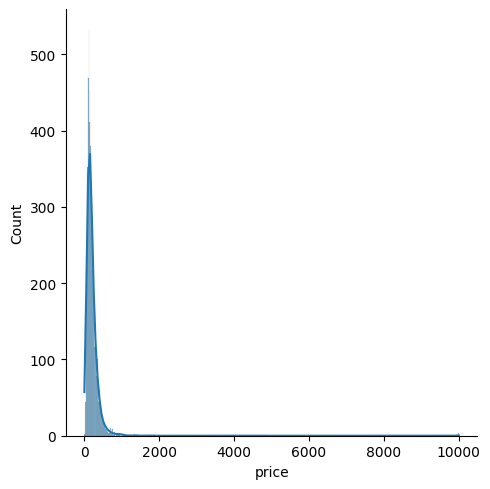

In [4]:
# Check price range
sns.displot(listings['price'], kde=True);

In [5]:
# Convert Pandas df to Geopandas df
listings_gpd = gpd.GeoDataFrame(listings,
                                geometry=gpd.points_from_xy(listings.longitude, listings.latitude, crs=4326))

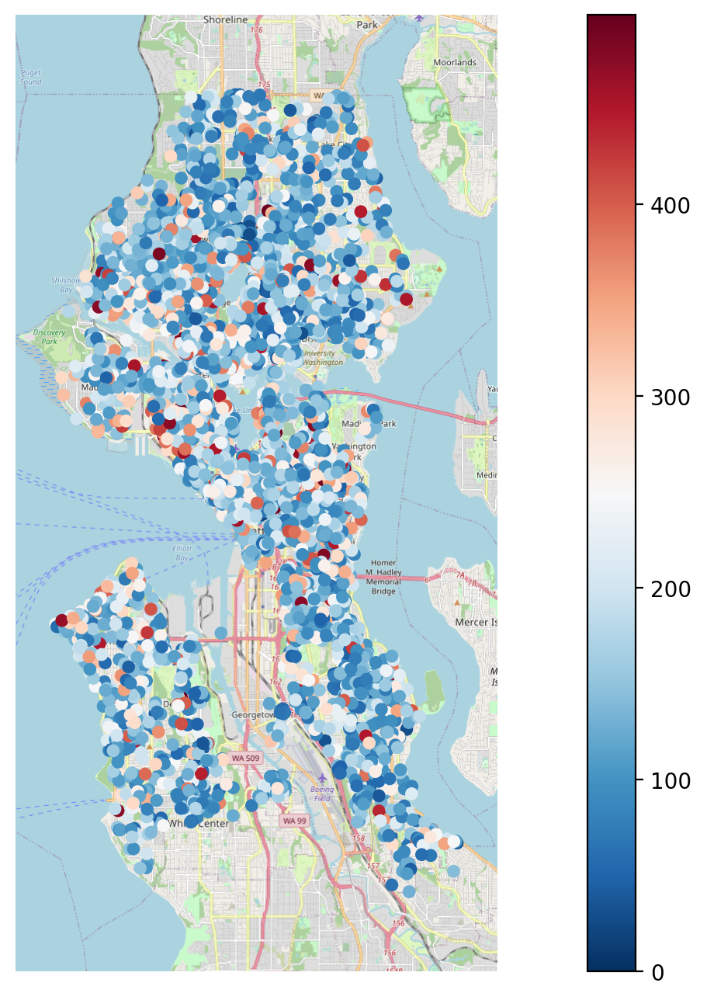

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

# Plot with geoplot
ax = gplt.webmap(listings_gpd.query('price < 500'), projection=gcrs.WebMercator())
gplt.pointplot(listings_gpd.query('price < 500'), cmap='RdBu_r', ax=ax, hue='price', legend=True)

# Manually adjust the figure size
ax.figure.set_size_inches(15, 8)

plt.show()


In [7]:
# packages for Hypothesis test
from pysal.explore import esda
from pysal.lib import weights
from esda.moran import Moran
from splot.esda import plot_moran
from splot import esda as esdaplot

In [8]:
# Generate weights Matrix W from the Geo Data
w = weights.Queen.from_dataframe(listings_gpd)

/usr/local/lib/python3.10/dist-packages/libpysal/cg/voronoi.py:173: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  region_df["geometry"] = [Polygon(vertices[region]) for region in regions]
/usr/local/lib/python3.10/dist-packages/libpysal/cg/voronoi.py:176: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_

In [9]:

# Row Standardization
w.transform = 'R'


/usr/local/lib/python3.10/dist-packages/splot/_viz_libpysal_mpl.py:115: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids_shp = gdf.centroid.values
/usr/local/lib/python3.10/dist-packages/splot/_viz_libpysal_mpl.py:154: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf.centroid.plot(ax=ax, **node_kws)


(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

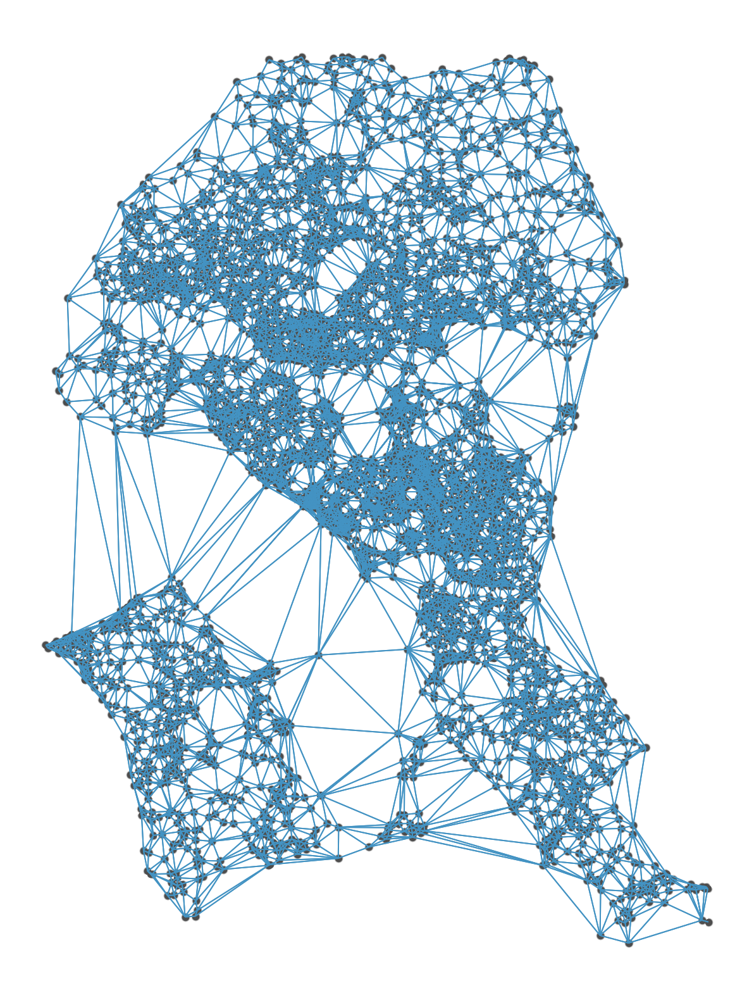

In [10]:

from splot.libpysal import plot_spatial_weights
plot_spatial_weights(w, listings_gpd)

In [11]:
# calculate the spatial lag
listings_gpd['price_lag'] = weights.spatial_lag.lag_spatial(w, listings_gpd['price'])

In [12]:
listings_gpd['price_std'] = ( listings_gpd['price'] - listings_gpd['price'].mean() )
listings_gpd['price_lag_std'] = ( listings_gpd['price_lag'] - listings_gpd['price_lag'].mean() )

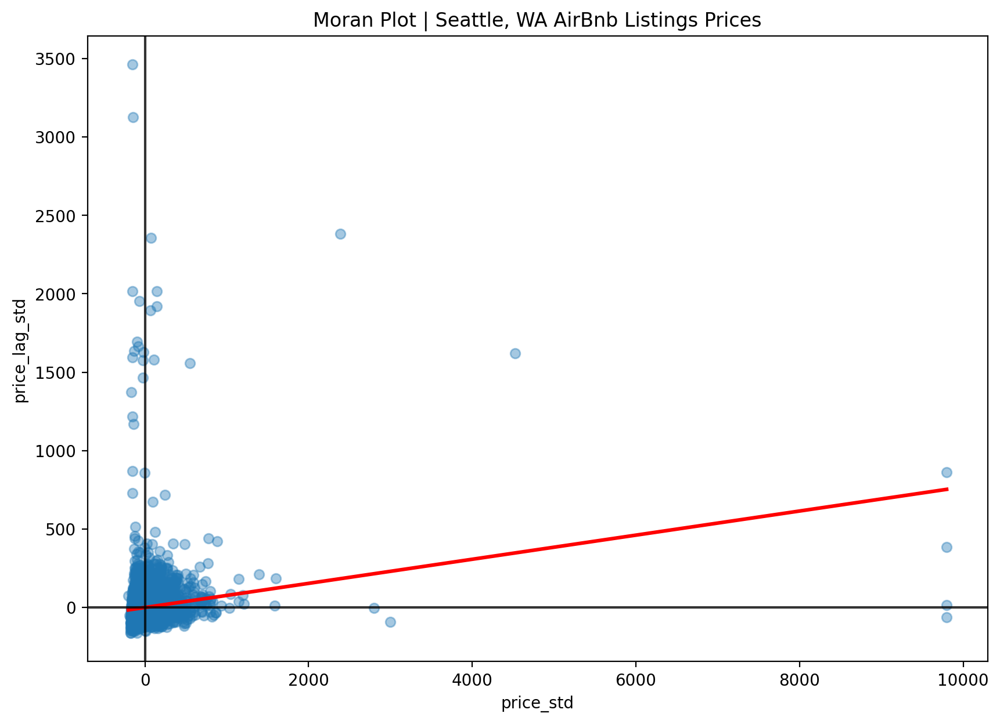

In [13]:

# Plotting Moran's I scatterplot
plt.figure(figsize=(10,7))

ax = sns.regplot(x= 'price_std', y= 'price_lag_std',
            ci=None, line_kws={'color':'r'}, scatter_kws= {'alpha': 0.4},
            data=listings_gpd)

ax.axvline(0, color='k', alpha=0.8)
ax.axhline(0, color='k', alpha=0.8)
ax.set_title('Moran Plot | Seattle, WA AirBnb Listings Prices');


In [14]:
# Calculating Moran's I for price (Global spatial correlation)
moran_stat = esda.moran.Moran(listings_gpd['price'], w)
print(f"Moran's I: {moran_stat.I}")
print(f"Moran's I p-Value: {moran_stat.p_sim}")

Moran's I: 0.07688111705291234
Moran's I p-Value: 0.001


/usr/local/lib/python3.10/dist-packages/splot/_viz_esda_mpl.py:354: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sbn.kdeplot(moran.sim, shade=shade, color=color, ax=ax, **kwargs)


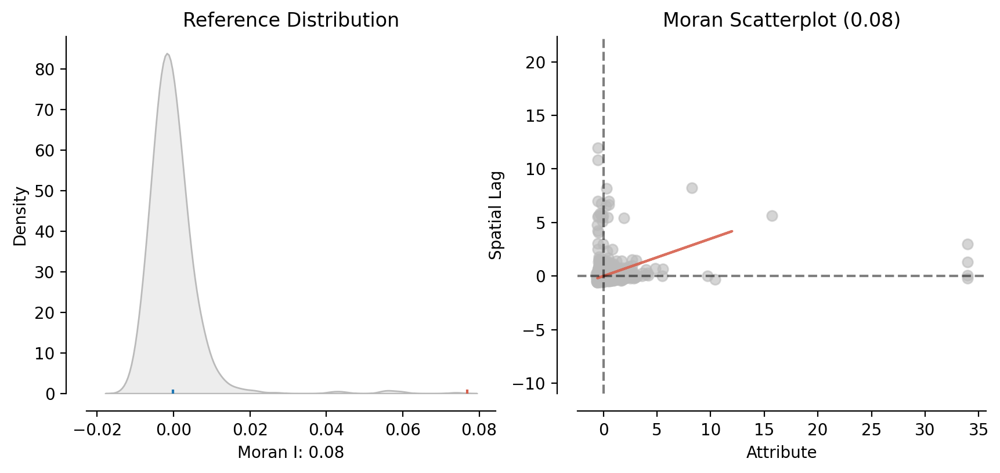

In [15]:

plot_moran(moran_stat);

In [16]:
price_local_I = esda.moran.Moran_Local(listings_gpd['price'], w)

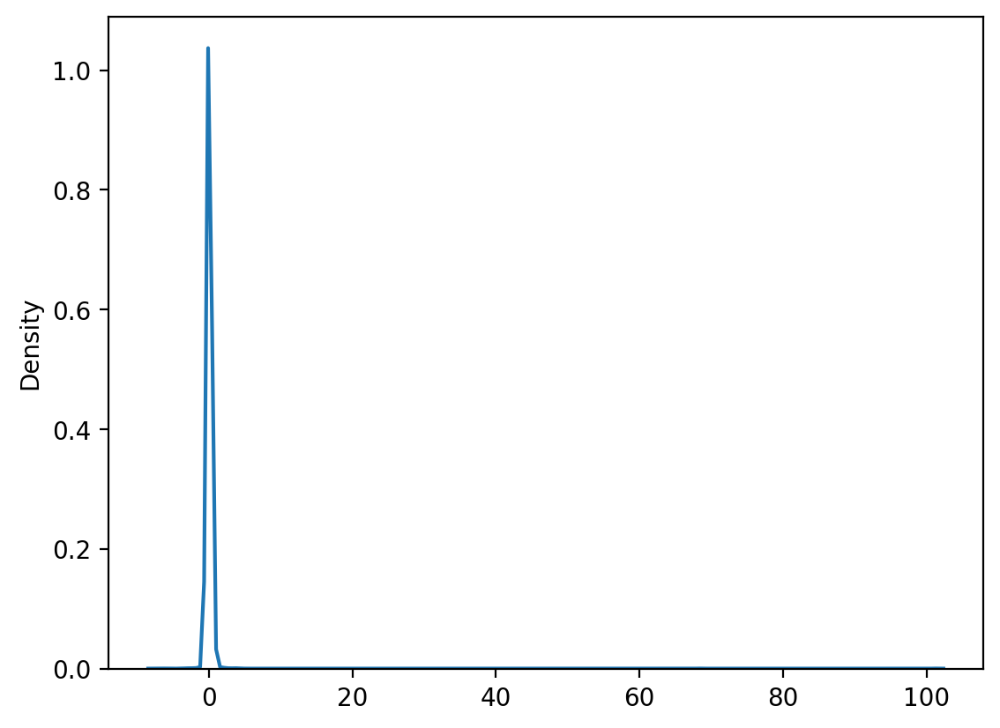

In [17]:

#Plotting the output density plot
sns.kdeplot(price_local_I.Is);

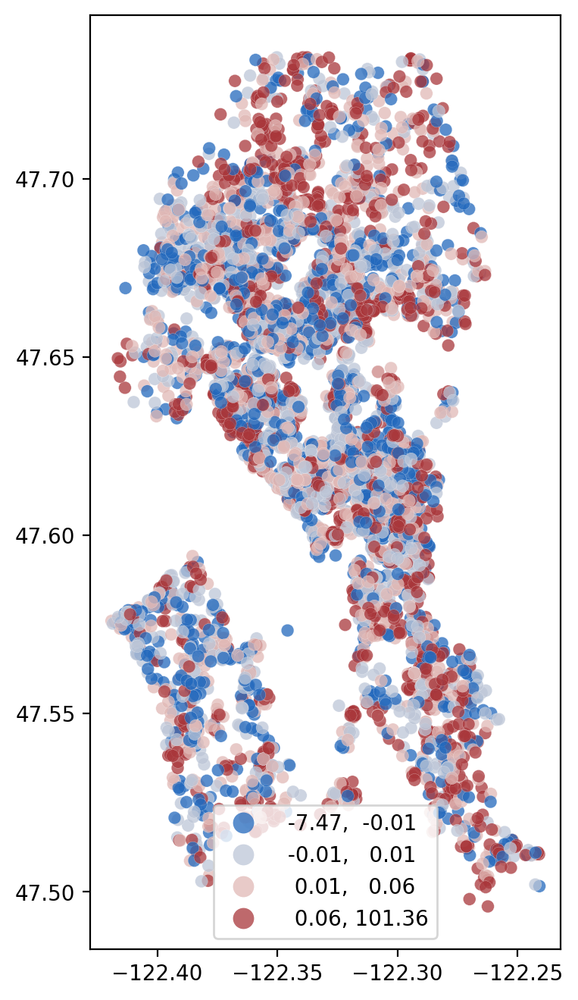

In [18]:

# Figure
f, ax = plt.subplots(1, figsize=(12,8))

# plot choropleth of local statistics
(listings_gpd
 .assign(ML_I = price_local_I.Is)
 .plot(column = 'ML_I', cmap='vlag',
       scheme='quantiles',
       k=4,
       edgecolor='white',
       linewidth= 0.1,
       alpha=0.75,
       legend=True,
       ax=ax)
);


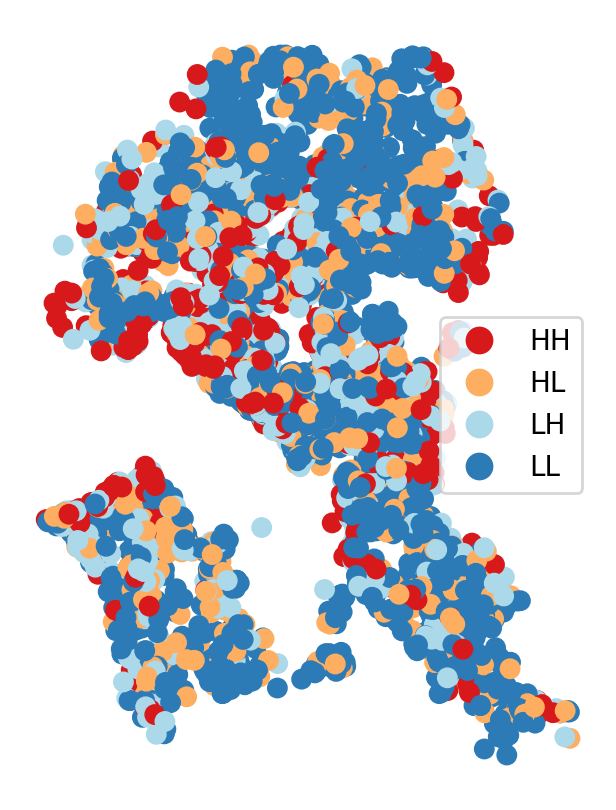

In [19]:
f, ax = plt.subplots(1, figsize=(5,5))

# Plot quadrants HH, HL, LH, LL
esdaplot.lisa_cluster(price_local_I,
                      listings_gpd,
                      p=1,
                      ax=ax);

In [20]:
# Determine what's statistically significant correlation
alpha = 0.05
labels = 1* (price_local_I.p_sim < alpha)

# Add to data frame
listings_gpd = listings_gpd.assign( stat_cd = labels)
listings_gpd['stat_label'] = listings_gpd.stat_cd.map({0:'Not stat significant', 1:'stat significant'})

In [21]:
price_local_I.p_sim

array([0.019, 0.106, 0.474, ..., 0.198, 0.198, 0.469])

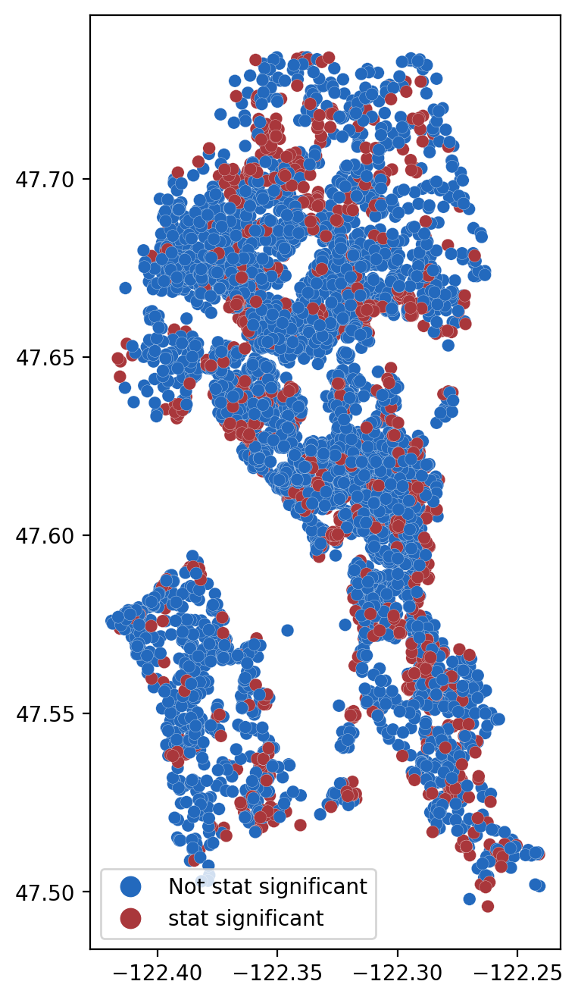

In [22]:
fig, ax = plt.subplots(1, figsize=(12,8))

# Plot statistically significant correlation
listings_gpd.plot(
    column='stat_label',
    categorical=True,
    k=2,
    cmap='vlag',
    edgecolor='white',
    linewidth=0.1,
    legend=True,
    ax=ax
)

plt.show()


In [23]:
quadrants = pd.DataFrame({'quadrant': price_local_I.q, 'p':price_local_I.p_sim})
quadrants['significant'] = labels
quadrants.quadrant.where(quadrants.p > alpha, other= 5, inplace=True )

# Add quadrants colors to variable in listings
listings['quadrants'] = quadrants.quadrant.map({1:'HH', 2:'LH', 3:'LL', 4:'HL', 5:'NS'})
listings['quadrants_colors'] = quadrants.quadrant.map({1:'red', 2:'lightblue', 3:'blue', 4:'orange', 5:'gray'})

In [24]:
geofile = '/content/drive/MyDrive/Colab Notebooks/dataset/neighbourhoods.geojson'
seattle = gpd.read_file(geofile)
seattle = seattle.to_crs(4326)

In [25]:
listings.head(2)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,quadrants,quadrants_colors
0,13226114,Home in Seattle · ★4.79 · 2 bedrooms · 4 beds ...,1884549,Denise & Sean,Rainier Valley,Columbia City,47.56555,-122.29385,Entire home/apt,240,4,24,2022-12-01,0.28,1,9,5,STR-OPLI-19-000171,NS,gray
1,12518952,Guest suite in Seattle · ★5.0 · 2 bedrooms · 6...,12677600,Joe,Other neighborhoods,Green Lake,47.68243,-122.33086,Entire home/apt,200,3,60,2023-06-13,0.71,1,113,9,STR-OPLI-19-002061,LH,lightblue


In [57]:
import folium
from folium.plugins import HeatMap
# Get quadrants and p-values
quadrants = pd.DataFrame({'quadrant': price_local_I.q, 'p':price_local_I.p_sim})
quadrants['significant'] = labels
quadrants.quadrant.where(quadrants.p > alpha, other= 5, inplace=True )

# Add quadrants colors to variable in listings
listings['quadrants'] = quadrants.quadrant.map({1:'HH', 2:'LH', 3:'LL', 4:'HL', 5:'NS'})
listings['quadrants_colors'] = quadrants.quadrant.map({1:'red', 2:'darkblue', 3:'green', 4:'blue', 5:'gray'})



data = listings[['latitude','longitude', 'price']].values
data =data.tolist()

# Create a Base map with Folium
m = folium.Map(location= [47.56555,	-122.29385], zoom_start=12)

for lat, lon, q, ptcolor in zip(listings.latitude, listings.longitude, listings.quadrants, listings.quadrants_colors):
  folium.CircleMarker(
     location=[lat, lon],
     radius=2,
     opacity=0.5,
     color=ptcolor,
     fill=True,
     fill_color=ptcolor,
     popup=q,
  ).add_to(m)


# Layer Control (add/ Remove layers)
folium.LayerControl().add_to(m)

#Display
m.save('map_p_dist.html')
m

In [27]:
m.save('map_p_dist.html')

In [44]:
# import folium
# from folium.plugins import HeatMap

# # Extract data points based on their quadrant labels
# hh_data = listings[listings.quadrants == 'HH'][['latitude', 'longitude']].values.tolist()
# lh_data = listings[listings.quadrants == 'LH'][['latitude', 'longitude']].values.tolist()
# ll_data = listings[listings.quadrants == 'LL'][['latitude', 'longitude']].values.tolist()
# hl_data = listings[listings.quadrants == 'HL'][['latitude', 'longitude']].values.tolist()

# # Create a Base map with Folium
# m = folium.Map(location=[47.56555, -122.29385], zoom_start=12)

# # Add HH heatmap layer
# HeatMap(hh_data, name='HH Density', gradient={0.6: 'red', 0.8: 'red', 1: 'red'}, blur=15, radius=15).add_to(m)

# # Add LH heatmap layer
# HeatMap(lh_data, name='LH Density', gradient={0.6: 'darkblue', 0.8: 'darkblue', 1: 'darkblue'}, blur=15, radius=15).add_to(m)

# # Add LL heatmap layer
# HeatMap(ll_data, name='LL Density', gradient={0.6: 'orange', 0.8: 'orange', 1: 'orange'}, blur=15, radius=15).add_to(m)

# # Add HL heatmap layer
# HeatMap(hl_data, name='HL Density', gradient={0.6: 'blue', 0.8: 'blue', 1: 'blue'}, blur=15, radius=15).add_to(m)

# # Add markers for NS
# for lat, lon, q, ptcolor in zip(listings.latitude, listings.longitude, listings.quadrants, listings.quadrants_colors):
#     if q == 'NS':
#         folium.CircleMarker(
#             location=[lat, lon],
#             radius=5,
#             opacity=0.6,
#             color=ptcolor,
#             fill=True,
#             fill_color=ptcolor,
#             popup=q,
#         ).add_to(m)

# # Layer Control (add/ Remove layers)
# folium.LayerControl().add_to(m)

# # Display
# m.save('all_quadrants_heatmap.html')
# m


In [59]:
# Group by neighborhood and count listings in each quadrant
quadrant_counts = listings.groupby('neighbourhood')['quadrants'].value_counts().unstack().fillna(0)

# Base map
m = folium.Map(location=[47.56555, -122.29385], zoom_start=12)

# Choropleth map for HH
folium.Choropleth(
    geo_data=seattle,
    name="HH Density",
    data=quadrant_counts,
    columns=[quadrant_counts.index, 'HH'],
    key_on="feature.properties.neighbourhood",
    fill_color="Reds",
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name="Density of HH Listings"
).add_to(m)

# Choropleth map for LL
folium.Choropleth(
    geo_data=seattle,
    name="LL Density",
    data=quadrant_counts,
    columns=[quadrant_counts.index, 'LL'],
    key_on="feature.properties.neighbourhood",
    fill_color="Greens",
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name="Density of LL Listings"
).add_to(m)

# Add layer control to toggle between HH and LL maps
folium.LayerControl().add_to(m)

m.save('quadrant_density.html')
m
